# ⚔️ So Sánh Hiệu Năng: FireGrounder V2 vs FireGrounder V3

Notebook này thực hiện kiểm thử và so sánh toàn diện giữa 2 thế hệ mô hình:
- **V2 (Baseline Dual-Head):** MobileNetV4-Medium + GAP + Dual Linear Heads (Classification + Direct Coordinate Regression).
- **V3 (FPN-lite Heatmap):** MobileNetV4-Medium + FPN-lite fusion (stride-4 + stride-8) -> Heatmap 64x64 -> Soft-Argmax.

### Hai bài test chính:
1. **Test 1: Đánh giá định lượng trên toàn bộ 1.300 ảnh Test (Held-out Set)**
   - So sánh Precision, Recall, F1, TP, FP, TN, FN.
   - So sánh định vị gốc lửa: MAE (px), Median (px), P90 (px), PCK@10px, PCK@25px, % sai số <= 5px.
   - Đo tốc độ suy luận (Latency ms & FPS trên GPU).
2. **Test 2: So sánh trực quan (Visual Preview) trên 25 ảnh ngẫu nhiên (Lưới 5x5)**
   - 🟢 Chấm xanh lá: Ground Truth (SAM 3)
   - 🔵 Chấm xanh lam: Dự đoán V2
   - 🔴 Dấu X đỏ: Dự đoán V3


In [1]:
# Cell 1: Thư viện & Thiết lập
import os, sys, json, time, random, math
from pathlib import Path
from typing import Dict, List, Tuple

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.transforms.functional as TF
from PIL import Image
import matplotlib.pyplot as plt
import timm

# ─── Cấu hình chung ───────────────────────────────────────────────
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IMG_SIZE = 256
THRESHOLD = 0.5
SEED = 42

print(f"🚀 Thiết bị chạy: {DEVICE}")
if DEVICE.type == 'cuda':
    print(f"   GPU: {torch.cuda.get_device_name(0)}")

# Thêm thư mục hiện tại vào sys.path để import V3
PROJECT_DIR = Path.cwd()
if str(PROJECT_DIR) not in sys.path:
    sys.path.insert(0, str(PROJECT_DIR))

from firegrounder_v3 import FireGrounderV3, load_checkpoint_v3, MEAN, STD, FIRE_THRESHOLD


🚀 Thiết bị chạy: cuda
   GPU: NVIDIA GeForce RTX 3060


In [10]:
# Cell 2: Định nghĩa kiến trúc FireGrounder V2 (Dual-Head GAP)
class FireGrounderV2(nn.Module):
    """Mô hình FireGrounder V2:
    MobileNetV4 backbone + Global Average Pooling (GAP) -> Vector 1280D
    Tách 2 nhánh (Dual-Head):
      - cls_head: Linear(1280, 256) -> BN -> GELU -> Dropout(0.4) -> Linear(256, 1) -> Sigmoid -> p_fire
      - reg_head: Linear(1280, 256) -> BN -> GELU -> Dropout(0.2) -> Linear(256, 2) -> Sigmoid -> (x_norm, y_norm)
    """
    def __init__(self, backbone_name="mobilenetv4_conv_medium.e500_r256_in1k", pretrained=False):
        super().__init__()
        self.backbone = timm.create_model(backbone_name, pretrained=pretrained, num_classes=0)
        in_features = 1280

        self.cls_head = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.BatchNorm1d(256),
            nn.GELU(),
            nn.Dropout(0.4),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
        self.reg_head = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.BatchNorm1d(256),
            nn.GELU(),
            nn.Dropout(0.2),
            nn.Linear(256, 2),
            nn.Sigmoid()
        )

    def forward(self, x):
        feat = self.backbone(x)
        p_fire = self.cls_head(feat)
        coord = self.reg_head(feat)
        return torch.cat([p_fire, coord], dim=1) # [B, 3] -> [p_fire, x_norm, y_norm]


def load_v2_model(ckpt_path: Path, device: torch.device) -> nn.Module:
    model = FireGrounderV2(pretrained=False).to(device)
    if ckpt_path.exists():
        ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
        state_dict = ckpt['model'] if 'model' in ckpt else ckpt.get('model_state_dict', ckpt)
        # Bỏ qua tiền tố module. nếu có
        state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
        model.load_state_dict(state_dict, strict=False)
        print(f"✅ Đã tải checkpoint V2 từ: {ckpt_path}")
    else:
        print(f"⚠️ Chưa tìm thấy file checkpoint V2 tại: {ckpt_path}")
        print("   (Mô hình V2 sẽ tạm thời khởi tạo trọng số mặc định để test khung so sánh)")
    model.eval()
    return model


In [11]:
# Cell 3: Tải mô hình V2 và V3
# Đường dẫn checkpoint
V3_CKPT = PROJECT_DIR / 'v3_outputs' / 'best_v3_fpn.pth'
V2_CKPT = PROJECT_DIR / 'best_mobilenetv4.pth' # Bạn có thể đổi đường dẫn tới file .pth của V2

# 1. Tải V3
assert V3_CKPT.exists(), f"Không tìm thấy checkpoint V3 tại: {V3_CKPT}"
model_v3 = FireGrounderV3(pretrained=False).to(DEVICE)
ckpt_v3 = torch.load(V3_CKPT, map_location=DEVICE, weights_only=False)
model_v3.load_state_dict(ckpt_v3['model_state_dict'])
model_v3.eval()
print(f"✅ V3 loaded: {V3_CKPT} (Epoch {ckpt_v3.get('epoch', '?')})")

# 2. Tải V2
model_v2 = load_v2_model(V2_CKPT, DEVICE)


[FireGrounderV3] backbone=mobilenetv4_conv_medium channels=[48, 80, 960] heatmap=64 params=7,545,650
✅ V3 loaded: d:\2D Detection\FireGrounder-V3-main\FireGrounder-V3-main\v3_outputs\best_v3_fpn.pth (Epoch 19)
✅ Đã tải checkpoint V2 từ: d:\2D Detection\FireGrounder-V3-main\FireGrounder-V3-main\best_mobilenetv4.pth


In [6]:
# Cell 4: Tạo Test Dataset (1.300 ảnh test độc lập)
# Tự động tìm dataset_labels.json
json_candidates = list(PROJECT_DIR.glob('**/dataset_labels.json'))
if not json_candidates:
    json_candidates = list(PROJECT_DIR.parent.glob('**/dataset_labels.json'))
json_file = json_candidates[0]

with open(json_file, encoding='utf-8') as f:
    all_records = json.load(f)

# Đánh chỉ mục toàn bộ ảnh
roots = [PROJECT_DIR, PROJECT_DIR.parent]
image_index = {}
exts = {'.jpg', '.jpeg', '.png', '.webp', '.bmp'}
for r in roots:
    if r.exists():
        for p in r.rglob('*'):
            if p.is_file() and p.suffix.lower() in exts:
                image_index.setdefault(p.name.lower(), p)
                image_index.setdefault(p.as_posix().lower(), p)

print(f"📂 Tìm thấy {len(image_index)} ảnh trong hệ thống.")

# Lọc đúng 1.300 ảnh test như trong pipeline huấn luyện
# Dedup
seen = set()
unique_records = []
for r in all_records:
    name = Path(r['image_path']).name.lower()
    if name not in seen:
        seen.add(name)
        unique_records.append(r)

test_records = [r for r in unique_records if '/test/' in r.get('image_path', '')]
if len(test_records) < 10:
    rng = random.Random(SEED)
    shuffled = unique_records.copy()
    rng.shuffle(shuffled)
    n_test = max(1, int(len(shuffled) * 0.10))
    test_records = shuffled[:n_test]

print(f"📄 Tập Test độc lập: {len(test_records)} ảnh")

# Dataset class
def resolve_img(raw_path: str) -> Path:
    direct = Path(raw_path)
    if direct.exists(): return direct
    norm = raw_path.replace('\\', '/').lower()
    if norm in image_index: return image_index[norm]
    base = Path(norm).name
    if base in image_index: return image_index[base]
    raise FileNotFoundError(f"Không thấy ảnh: {raw_path}")

class CompareTestDataset(Dataset):
    def __init__(self, records):
        self.records = records

    def __len__(self):
        return len(self.records)

    def __getitem__(self, idx):
        item = self.records[idx]
        img_path = resolve_img(str(item['image_path']))
        img = Image.open(img_path).convert('RGB')
        has_fire = float(item.get('has_fire', 1))
        if has_fire > 0.5:
            x, y = item.get('p_fire', [0.0, 0.0])[:2]
            x, y = max(0.0, min(1.0, float(x))), max(0.0, min(1.0, float(y)))
        else:
            x, y = 0.0, 0.0

        img = TF.resize(img, [IMG_SIZE, IMG_SIZE])
        tensor = TF.normalize(TF.to_tensor(img), MEAN, STD)
        target = torch.tensor([has_fire, x, y], dtype=torch.float32)
        return tensor, target, str(img_path)

test_ds = CompareTestDataset(test_records)
test_loader = DataLoader(test_ds, batch_size=32, shuffle=False, num_workers=0)
print(f"✅ Đã tạo Test Loader: {len(test_loader)} batches")


📂 Tìm thấy 13004 ảnh trong hệ thống.
📄 Tập Test độc lập: 1300 ảnh
✅ Đã tạo Test Loader: 41 batches


In [13]:
# Cell 5: TEST 1 — Đánh giá định lượng & Đo tốc độ suy luận (Latency)
@torch.no_grad()
def evaluate_model(model, loader, device, model_name="Model", threshold=0.5):
    model.eval()
    tps, fps, fns, tns = 0, 0, 0, 0
    errors_px = []
    
    # Đo latency
    start_time = time.time()
    total_samples = 0
    
    for images, targets, _ in loader:
        images = images.to(device)
        targets = targets.to(device)
        batch_n = images.size(0)
        total_samples += batch_n
        
        preds = model(images)
        if isinstance(preds, dict):
            preds = preds['pred']
            
        p_fire = preds[:, 0]
        gt_fire = targets[:, 0]
        
        pred_label = (p_fire >= threshold).float()
        gt_label = (gt_fire >= 0.5).float()
        
        tps += int(((pred_label == 1) & (gt_label == 1)).sum().item())
        fps += int(((pred_label == 1) & (gt_label == 0)).sum().item())
        fns += int(((pred_label == 0) & (gt_label == 1)).sum().item())
        tns += int(((pred_label == 0) & (gt_label == 0)).sum().item())
        
        # Đánh giá sai số tọa độ trên các mẫu thực sự có lửa
        fire_mask = (gt_fire >= 0.5)
        if fire_mask.any():
            pred_xy = preds[fire_mask, 1:3]
            gt_xy = targets[fire_mask, 1:3]
            dist_px = torch.norm((pred_xy - gt_xy) * IMG_SIZE, dim=-1)
            errors_px.extend(dist_px.cpu().tolist())

    elapsed = time.time() - start_time
    latency_ms = (elapsed / total_samples) * 1000.0
    fps = total_samples / elapsed
    
    precision = tps / (tps + fps + 1e-8)
    recall = tps / (tps + fns + 1e-8)
    f1 = 2 * precision * recall / (precision + recall + 1e-8)
    
    err_arr = np.array(errors_px) if errors_px else np.array([float('nan')])
    mae = float(np.mean(err_arr))
    median = float(np.median(err_arr))
    p90 = float(np.percentile(err_arr, 90))
    pck10 = float((err_arr <= 10.0).mean())
    pck25 = float((err_arr <= 25.0).mean())
    within5 = float((err_arr <= 5.0).mean() * 100)
    
    return {
        "name": model_name,
        "precision": precision, "recall": recall, "f1": f1,
        "tp": tps, "fp": fps, "fn": fns, "tn": tns,
        "mae_px": mae, "median_px": median, "p90_px": p90,
        "pck10": pck10, "pck25": pck25, "within5_pct": within5,
        "latency_ms": latency_ms, "fps": fps
    }

print("⏳ Đang đánh giá V3 trên 1.300 ảnh test...")
m_v3 = evaluate_model(model_v3, test_loader, DEVICE, "FireGrounder V3 (FPN-lite)")

print("⏳ Đang đánh giá V2 trên 1.300 ảnh test...")
m_v2 = evaluate_model(model_v2, test_loader, DEVICE, "FireGrounder V2 (Dual-Head)")

# ─── BẢNG SO SÁNH TRỰC DIỆN ──────────────────────────────────────
print('\n' + '═'*78)
print(f"{'CHỈ SỐ ĐÁNH GIÁ (TEST SET: 1300 ẢNH)':<38} | {'V2 (Dual-Head)':<16} | {'V3 (FPN-lite)':<16}")
print('═'*78)
print(f"{'F1-Score':<38} | {m_v2['f1']*100:13.2f}% | {m_v3['f1']*100:13.2f}%")
print(f"{'Precision (Độ chính xác không báo giả)':<38} | {m_v2['precision']*100:13.2f}% | {m_v3['precision']*100:13.2f}%")
print(f"{'Recall (Độ nhạy không bỏ sót lửa)':<38} | {m_v2['recall']*100:13.2f}% | {m_v3['recall']*100:13.2f}%")
print(f"{'Số ca báo giả (False Positives - FP)':<38} | {m_v2['fp']:14.0f} | {m_v3['fp']:14.0f}")
print(f"{'Số ca bỏ sót lửa (False Negatives - FN)':<38} | {m_v2['fn']:14.0f} | {m_v3['fn']:14.0f}")
print('─'*78)
print(f"{'MAE Sai số trung bình (Pixel)':<38} | {m_v2['mae_px']:14.2f}px | {m_v3['mae_px']:14.2f}px")
print(f"{'Trung vị sai số (Median Pixel)':<38} | {m_v2['median_px']:14.2f}px | {m_v3['median_px']:14.2f}px")
print(f"{'P90 Sai số (90% mẫu dưới ngưỡng)':<38} | {m_v2['p90_px']:14.2f}px | {m_v3['p90_px']:14.2f}px")
print(f"{'PCK@10px (Chuẩn khắt khe)':<38} | {m_v2['pck10']*100:13.2f}% | {m_v3['pck10']*100:13.2f}%")
print(f"{'PCK@25px (Chuẩn thực tế)':<38} | {m_v2['pck25']*100:13.2f}% | {m_v3['pck25']*100:13.2f}%")
print(f"{'Tỷ lệ lệch cực nhỏ (<= 5px)':<38} | {m_v2['within5_pct']:13.2f}% | {m_v3['within5_pct']:13.2f}%")
print('─'*78)
print(f"{'Độ trễ suy luận (Latency / frame)':<38} | {m_v2['latency_ms']:12.2f}ms | {m_v3['latency_ms']:12.2f}ms")
print(f"{'Tốc độ khung hình (FPS)':<38} | {m_v2['fps']:14.1f} | {m_v3['fps']:14.1f}")
print('═'*78)


⏳ Đang đánh giá V3 trên 1.300 ảnh test...
⏳ Đang đánh giá V2 trên 1.300 ảnh test...

══════════════════════════════════════════════════════════════════════════════
CHỈ SỐ ĐÁNH GIÁ (TEST SET: 1300 ẢNH)   | V2 (Dual-Head)   | V3 (FPN-lite)   
══════════════════════════════════════════════════════════════════════════════
F1-Score                               |         93.65% |         88.34%
Precision (Độ chính xác không báo giả) |         90.87% |         89.89%
Recall (Độ nhạy không bỏ sót lửa)      |         96.60% |         86.85%
Số ca báo giả (False Positives - FP)   |             83 |             83
Số ca bỏ sót lửa (False Negatives - FN) |             29 |            112
──────────────────────────────────────────────────────────────────────────────
MAE Sai số trung bình (Pixel)          |          70.75px |          23.96px
Trung vị sai số (Median Pixel)         |          70.96px |           4.95px
P90 Sai số (90% mẫu dưới ngưỡng)       |         110.45px |          89.57px
PCK@

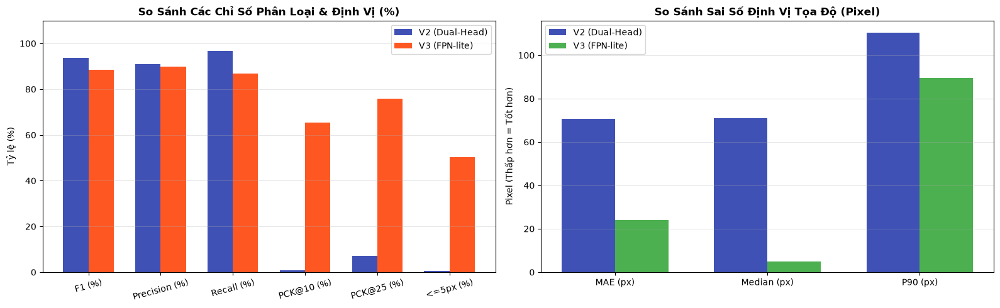

📈 Đã lưu biểu đồ: d:\2D Detection\FireGrounder-V3-main\FireGrounder-V3-main\v3_outputs\comparison_chart.png


In [14]:
# Cell 6: Trực quan hóa so sánh bằng biểu đồ
metrics_names = ['F1 (%)', 'Precision (%)', 'Recall (%)', 'PCK@10 (%)', 'PCK@25 (%)', '<=5px (%)']
v2_scores = [m_v2['f1']*100, m_v2['precision']*100, m_v2['recall']*100, m_v2['pck10']*100, m_v2['pck25']*100, m_v2['within5_pct']]
v3_scores = [m_v3['f1']*100, m_v3['precision']*100, m_v3['recall']*100, m_v3['pck10']*100, m_v3['pck25']*100, m_v3['within5_pct']]

x = np.arange(len(metrics_names))
width = 0.35

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

# Biểu đồ tỷ lệ %
rects1 = ax1.bar(x - width/2, v2_scores, width, label='V2 (Dual-Head)', color='#3F51B5')
rects2 = ax1.bar(x + width/2, v3_scores, width, label='V3 (FPN-lite)', color='#FF5722')
ax1.set_ylabel('Tỷ lệ (%)')
ax1.set_title('So Sánh Các Chỉ Số Phân Loại & Định Vị (%)', fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(metrics_names, rotation=15)
ax1.set_ylim(0, 110)
ax1.legend()
ax1.grid(axis='y', alpha=0.3)

# Biểu đồ sai số Pixel (càng thấp càng tốt)
err_names = ['MAE (px)', 'Median (px)', 'P90 (px)']
v2_err = [m_v2['mae_px'], m_v2['median_px'], m_v2['p90_px']]
v3_err = [m_v3['mae_px'], m_v3['median_px'], m_v3['p90_px']]

x2 = np.arange(len(err_names))
rects3 = ax2.bar(x2 - width/2, v2_err, width, label='V2 (Dual-Head)', color='#3F51B5')
rects4 = ax2.bar(x2 + width/2, v3_err, width, label='V3 (FPN-lite)', color='#4CAF50')
ax2.set_ylabel('Pixel (Thấp hơn = Tốt hơn)')
ax2.set_title('So Sánh Sai Số Định Vị Tọa Độ (Pixel)', fontweight='bold')
ax2.set_xticks(x2)
ax2.set_xticklabels(err_names)
ax2.legend()
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
out_fig = PROJECT_DIR / 'v3_outputs' / 'comparison_chart.png'
plt.savefig(out_fig, dpi=150)
plt.show()
print(f"📈 Đã lưu biểu đồ: {out_fig}")


C:\Users\TOTIN\AppData\Local\Temp\ipykernel_9360\2523595318.py:103: UserWarning: Glyph 127807 (\N{HERB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\TOTIN\AppData\Local\Temp\ipykernel_9360\2523595318.py:103: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\TOTIN\AppData\Local\Temp\ipykernel_9360\2523595318.py:105: UserWarning: Glyph 127807 (\N{HERB}) missing from font(s) DejaVu Sans.
  plt.savefig(preview_path, dpi=130, bbox_inches='tight')
C:\Users\TOTIN\AppData\Local\Temp\ipykernel_9360\2523595318.py:105: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(preview_path, dpi=130, bbox_inches='tight')


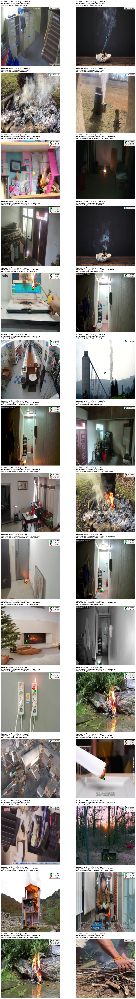

📸 Đã lưu ảnh so sánh 30 mẫu ra: d:\2D Detection\FireGrounder-V3-main\FireGrounder-V3-main\v3_outputs\comparison_30_preview.png


In [20]:
# Cell 7: TEST 2 — So sánh trực quan 30 ảnh (Tỷ lệ 20 lửa : 10 không lửa, 2 ảnh/hàng)
import random, math

# ─── 1. Lọc mẫu theo đúng tỷ lệ 2 lửa : 1 không lửa (20 : 10) ──────────
rng = random.Random(123)  # Đổi seed nếu muốn xem tập 30 ảnh ngẫu nhiên khác

fire_indices = [i for i, r in enumerate(test_records) if r.get('has_fire', 1) == 1]
no_fire_indices = [i for i, r in enumerate(test_records) if r.get('has_fire', 1) == 0]

n_fire = min(20, len(fire_indices))
n_no_fire = min(10, len(no_fire_indices))

chosen_fire = rng.sample(fire_indices, n_fire)
chosen_no_fire = rng.sample(no_fire_indices, n_no_fire)

sample_indices = chosen_fire + chosen_no_fire
rng.shuffle(sample_indices)  # Trộn đều ngẫu nhiên

# ─── 2. Thiết lập khung vẽ 15 hàng x 2 cột ─────────────────────────────
cols = 2
rows = (len(sample_indices) + cols - 1) // cols  # Tự động tính: 15 hàng

inverse_norm = transforms.Normalize(
    mean=[-m/s for m, s in zip(MEAN, STD)],
    std=[1.0/s for s in STD]
)

fig, axes = plt.subplots(rows, cols, figsize=(20, 8 * rows))
axes = np.array(axes).flatten()

model_v2.eval()
model_v3.eval()

# ─── 3. Chạy dự đoán và hiển thị từng ảnh ──────────────────────────────
with torch.no_grad():
    for i, idx in enumerate(sample_indices):
        ax = axes[i]
        tensor, target, img_path = test_ds[idx]
        inp = tensor.unsqueeze(0).to(DEVICE)
        
        # Dự đoán V3
        out_v3 = model_v3(inp)
        if isinstance(out_v3, dict):
            out_v3 = out_v3['pred']
        pred_v3 = out_v3[0].cpu().numpy()
        
        # Dự đoán V2
        out_v2 = model_v2(inp)
        if isinstance(out_v2, dict):
            out_v2 = out_v2['pred']
        pred_v2 = out_v2[0].cpu().numpy()
        
        # Ảnh gốc un-normalized
        img_show = inverse_norm(tensor).permute(1, 2, 0).cpu().numpy().clip(0, 1)
        ax.imshow(img_show)
        
        gt_has_fire = target[0].item() > 0.5
        v2_has_fire = pred_v2[0] >= THRESHOLD
        v3_has_fire = pred_v3[0] >= THRESHOLD
        
        gt_x, gt_y = target[1].item() * IMG_SIZE, target[2].item() * IMG_SIZE
        v2_x, v2_y = pred_v2[1] * IMG_SIZE, pred_v2[2] * IMG_SIZE
        v3_x, v3_y = pred_v3[1] * IMG_SIZE, pred_v3[2] * IMG_SIZE
        
        # 🟢 Vẽ Ground Truth (Chấm tròn xanh lá)
        if gt_has_fire:
            ax.scatter(gt_x, gt_y, c='lime', s=220, edgecolors='black', linewidth=2.0, zorder=5, label='GT (SAM 3)')
            
        # 🔵 Vẽ V2 (Chấm tròn xanh lam)
        if v2_has_fire:
            ax.scatter(v2_x, v2_y, c='deepskyblue', s=170, marker='o', edgecolors='black', linewidth=1.5, zorder=6, label=f'V2 ({pred_v2[0]*100:.1f}%)')
            
        # 🔴 Vẽ V3 (Dấu X đỏ đậm)
        if v3_has_fire:
            ax.scatter(v3_x, v3_y, c='red', s=250, marker='x', linewidths=3.2, zorder=7, label=f'V3 ({pred_v3[0]*100:.1f}%)')
            
        # Tính khoảng cách sai số (pixel) nếu có lửa
        v2_err_str = ""
        v3_err_str = ""
        if gt_has_fire:
            if v2_has_fire:
                dist_v2 = math.sqrt((v2_x - gt_x)**2 + (v2_y - gt_y)**2)
                v2_err_str = f" | Lệch: {dist_v2:.1f}px"
            if v3_has_fire:
                dist_v3 = math.sqrt((v3_x - gt_x)**2 + (v3_y - gt_y)**2)
                v3_err_str = f" | Lệch: {dist_v3:.1f}px"

        # Chú thích rõ ràng trên đầu mỗi ảnh
        l1 = f"Ảnh #{i+1:02d} — NHÃN CHUẨN: {'🔥 CÓ LỬA' if gt_has_fire else '🌿 KHÔNG LỬA'}"
        l2 = f"V2 (Dual-Head): {'🔥 Báo lửa' if v2_has_fire else '🌿 Không'} (conf={pred_v2[0]*100:.1f}%){v2_err_str}"
        l3 = f"V3 (FPN-lite) : {'🔥 Báo lửa' if v3_has_fire else '🌿 Không'} (conf={pred_v3[0]*100:.1f}%){v3_err_str}"
        
        ax.set_title(f"{l1}\n{l2}\n{l3}", fontsize=11, fontweight='bold', loc='left', pad=10)
        ax.axis('off')
        
        if gt_has_fire or v2_has_fire or v3_has_fire:
            ax.legend(loc='upper right', fontsize=10, framealpha=0.9, facecolor='white', edgecolor='gray')

# Ẩn các ô thừa nếu có
for j in range(len(sample_indices), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
preview_path = PROJECT_DIR / 'v3_outputs' / 'comparison_30_preview.png'
plt.savefig(preview_path, dpi=130, bbox_inches='tight')
plt.show()
print(f"📸 Đã lưu ảnh so sánh 30 mẫu ra: {preview_path}")
